In [1]:
import itertools
import numpy as np
from itertools import permutations 
import json

from classes import *
from IDA_frank_main import *
from IDA_frank_main_1 import *
EVA = True


2025-04-03 16:01:41.204969: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
25-Apr-03 16:01:44 fatf.utils.array.tools INFO     Using numpy's numpy.lib.recfunctions.structured_to_unstructured as fatf.utils.array.tools.structured_to_unstructured and fatf.utils.array.tools.structured_to_unstructured_row.


In [2]:
RULE = True
PAST = True
SKEPT = True
GROUP = True

N_BINS = 10
N_VAR = 3
MAX = 5

#predict_mode = 100
#believe_mode = 0


In [3]:
dataset = 'adult'
target = ''


In [4]:
KNN = False

if dataset == 'adult':
    target = 'Probability'
    protected = ['sex']
    rule_att = 'capital-gain'
    if KNN:
        rule_value = 9000
    else:
        rule_value = 0.086141
    cats = ['workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'native-country']
elif dataset == 'HR':
    target = 'is_promoted'
    protected = ['gender']
    rule_att = 'awards_won?'
    if KNN:
        rule_value = 0
    else:
        rule_value = 0
    cats = ['awards_won?', 'gender', 'department', 'recruitment_channel']
elif dataset == 'compas':
    target = 'two_year_recid'
    protected = ['sex']
    rule_att = 'priors_count'
    if KNN:
        rule_value = 0
    else:
        rule_value = 0
    cats = ['sex', 'race', 'c_charge_degree']
    

df = pd.read_json("Datasets/bot_"+dataset+"_stream.json")
user_train = pd.read_json("Datasets/bot_"+dataset+"_user_train.json")
frank_train = pd.read_json("Datasets/bot_"+dataset+"_frank_train.json")
test = pd.read_json("Datasets/bot_"+dataset+"_test.json")

model = GaussianNB()

#training the user
Y_user_train = list(user_train[target])
Y_user_train = [bool(y) for y in Y_user_train]
X_user_train = user_train.loc[:, user_train.columns!=target]
X_user_train = X_user_train.values.tolist()

model.fit(X_user_train, Y_user_train) 

#training Frank
Y_frank_train = list(frank_train[target])
Y_frank_train = [bool(y) for y in Y_frank_train]
X_frank_train = frank_train.loc[:, frank_train.columns!=target]
X_frank_train = list(X_frank_train.to_dict(orient='index').values())
    # 
#test set (for Frank)
Y_test = list(test[target])
Y_test = [bool(y) for y in Y_test]
X_test = test.loc[:, test.columns!=target]
X_test = list(X_test.to_dict(orient='index').values())
# 





In [5]:
X_user_train

[[46, 5, 9, 2, 13, 0, 4, 0, 0, 0, 40, 38],
 [65, 4, 9, 2, 4, 0, 4, 0, 10605, 0, 60, 38],
 [43, 3, 14, 2, 3, 0, 1, 0, 0, 0, 60, 23],
 [48, 2, 9, 2, 12, 0, 4, 0, 0, 0, 89, 38],
 [34, 2, 10, 2, 3, 0, 4, 0, 7298, 0, 40, 38],
 [37, 2, 7, 2, 2, 0, 4, 0, 0, 0, 25, 38],
 [34, 2, 5, 2, 2, 0, 4, 0, 0, 0, 40, 38],
 [47, 2, 10, 2, 3, 0, 4, 0, 0, 0, 60, 38],
 [35, 2, 9, 0, 12, 4, 4, 1, 0, 0, 75, 38],
 [59, 5, 13, 2, 3, 0, 4, 0, 10605, 0, 50, 38],
 [20, 2, 10, 4, 5, 3, 4, 0, 0, 0, 50, 38],
 [61, 2, 9, 4, 11, 3, 4, 1, 0, 0, 40, 38],
 [40, 2, 6, 0, 2, 1, 4, 0, 0, 0, 50, 38],
 [30, 2, 10, 2, 9, 0, 4, 0, 0, 0, 25, 38],
 [34, 1, 10, 4, 10, 1, 4, 0, 0, 0, 50, 38],
 [28, 1, 12, 2, 0, 5, 4, 1, 0, 0, 40, 38],
 [55, 2, 9, 2, 9, 3, 4, 1, 0, 0, 40, 38],
 [31, 4, 9, 0, 7, 1, 4, 0, 0, 0, 35, 38],
 [55, 2, 13, 2, 3, 0, 4, 0, 15024, 0, 55, 38],
 [49, 4, 13, 2, 4, 0, 4, 0, 0, 0, 50, 38],
 [56, 2, 10, 2, 4, 0, 4, 0, 0, 0, 60, 38],
 [53, 2, 13, 2, 2, 0, 4, 0, 0, 0, 40, 38],
 [29, 2, 16, 2, 9, 0, 4, 0, 0, 0, 50, 38],
 

In [5]:
believe_value = 0.8 #For Frank Suggestions
rethink_value = 0.8 #Individual Fairness
fairness_value = 0.25 #top records to re-label (Group Fairness)

expertise_value = 0.5

In [6]:
#user_model = GroundTruther(believe_value, rethink_value, fairness_value, expertise_value)
user_model = ModelBased(believe_value, rethink_value, fairness_value, GaussianNB(), X_user_train, Y_user_train)

In [8]:
i_true = 0
i_false = 0
for i in Y_frank_train :
    if i == False:
        i_false+=1
    else:
        i_true+=1    

print('False:',i_false)
print('True:',i_true)       

False: 183
True: 67


In [9]:
X_frank_train

[{'age': 46,
  'workclass': 5,
  'education-num': 9,
  'marital-status': 2,
  'occupation': 13,
  'relationship': 0,
  'race': 4,
  'sex': 0,
  'capital-gain': 0,
  'capital-loss': 0,
  'hours-per-week': 40,
  'native-country': 38},
 {'age': 65,
  'workclass': 4,
  'education-num': 9,
  'marital-status': 2,
  'occupation': 4,
  'relationship': 0,
  'race': 4,
  'sex': 0,
  'capital-gain': 10605,
  'capital-loss': 0,
  'hours-per-week': 60,
  'native-country': 38},
 {'age': 43,
  'workclass': 3,
  'education-num': 14,
  'marital-status': 2,
  'occupation': 3,
  'relationship': 0,
  'race': 1,
  'sex': 0,
  'capital-gain': 0,
  'capital-loss': 0,
  'hours-per-week': 60,
  'native-country': 23},
 {'age': 48,
  'workclass': 2,
  'education-num': 9,
  'marital-status': 2,
  'occupation': 12,
  'relationship': 0,
  'race': 4,
  'sex': 0,
  'capital-gain': 0,
  'capital-loss': 0,
  'hours-per-week': 89,
  'native-country': 38},
 {'age': 34,
  'workclass': 2,
  'education-num': 10,
  'marital-

In [10]:
stats_st = df.describe()
stats_st

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,Probability
count,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.4850,2.226000,10.174500,2.577500,6.162500,1.494500,3.605500,0.349500,1176.510500,112.939500,40.832500,36.133000,0.243500
std,13.4205,1.023938,2.602198,1.538238,3.998761,1.612845,0.922657,0.476931,7225.514336,458.153307,12.388308,6.614695,0.429302
min,17.0000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,29.0000,2.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
50%,38.0000,2.000000,10.000000,2.000000,7.000000,1.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
75%,49.0000,2.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,45.000000,38.000000,0.000000
max,90.0000,5.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,99999.000000,4356.000000,99.000000,40.000000,1.000000


In [11]:
stats_train = frank_train.describe()
stats_train

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,Probability
count,250.000000,250.00000,250.000000,250.000000,250.000000,250.00000,250.00000,250.000000,250.000000,250.000000,250.000000,250.000000,250.000000
mean,39.560000,2.32000,10.316000,2.580000,6.384000,1.46800,3.69200,0.320000,1828.940000,46.804000,41.856000,36.140000,0.268000
std,13.285799,1.03046,2.651086,1.495509,3.966292,1.64798,0.82939,0.467412,11109.394335,280.499106,13.098149,6.477052,0.443806
min,17.000000,0.00000,1.000000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,4.000000,0.000000,0.000000
25%,30.000000,2.00000,9.000000,2.000000,3.000000,0.00000,4.00000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
50%,37.000000,2.00000,10.000000,2.000000,7.000000,1.00000,4.00000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
75%,49.000000,2.00000,13.000000,4.000000,10.000000,3.00000,4.00000,1.000000,0.000000,0.000000,50.000000,38.000000,1.000000
max,80.000000,5.00000,16.000000,6.000000,13.000000,5.00000,4.00000,1.000000,99999.000000,1977.000000,99.000000,38.000000,1.000000


In [12]:
stats_user = user_train.describe()
stats_user

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,Probability
count,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.00000,500.000000,500.000000
mean,39.470000,2.302000,10.146000,2.680000,6.306000,1.498000,3.714000,0.342000,1609.042000,76.842000,41.97000,36.412000,0.248000
std,13.928284,1.035829,2.688334,1.555132,3.870701,1.612202,0.793387,0.474855,10176.250506,366.536912,13.73486,5.906609,0.432284
min,17.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.00000,0.000000,0.000000
25%,29.000000,2.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,40.00000,38.000000,0.000000
50%,37.000000,2.000000,10.000000,2.000000,7.000000,1.000000,4.000000,0.000000,0.000000,0.000000,40.00000,38.000000,0.000000
75%,49.000000,2.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,50.00000,38.000000,0.000000
max,90.000000,5.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,99999.000000,2559.000000,99.00000,39.000000,1.000000


In [13]:
stats_st

,age,workclass,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,Probability
count,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.4850,2.226000,10.174500,2.577500,6.162500,1.494500,3.605500,0.349500,1176.510500,112.939500,40.832500,36.133000,0.243500
std,13.4205,1.023938,2.602198,1.538238,3.998761,1.612845,0.922657,0.476931,7225.514336,458.153307,12.388308,6.614695,0.429302
min,17.0000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,29.0000,2.000000,9.000000,2.000000,3.000000,0.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
50%,38.0000,2.000000,10.000000,2.000000,7.000000,1.000000,4.000000,0.000000,0.000000,0.000000,40.000000,38.000000,0.000000
75%,49.0000,2.000000,13.000000,4.000000,9.000000,3.000000,4.000000,1.000000,0.000000,0.000000,45.000000,38.000000,0.000000
max,90.0000,5.000000,16.000000,6.000000,13.000000,5.000000,4.000000,1.000000,99999.000000,4356.000000,99.000000,40.000000,1.000000


Riorganizzo i dataset per gli esperimenti

In [14]:
df_logomplete = pd.concat([df, frank_train,test]).reset_index(drop=True)
#Funzione che splitta il dataset in 3 sotto dataset (20,40,40) e crea tre dataset caratterizzati da 70% classe maggioritaria e 30%classe minoritaria
def split_dataset_with_balance(df, target_col):
    # Separare i dati in base alla classe
    majority_class = df[df[target_col] == df[target_col].value_counts().idxmax()]
    minority_class = df[df[target_col] == df[target_col].value_counts().idxmin()]

    # Calcolare il numero di campioni per ciascun sotto-dataset
    total_len = len(df)
    start_len = int(total_len * 0.2)
    train_len = int(total_len * 0.4)
    test_len = total_len - start_len - train_len

    # Calcolare il numero di campioni per ciascuna classe in ogni sotto-dataset
    majority_start = min(len(majority_class), int(start_len * 0.7))
    minority_start = min(len(minority_class), start_len - majority_start)

    majority_train = min(len(majority_class) - majority_start, int(train_len * 0.7))
    minority_train = min(len(minority_class) - minority_start, train_len - majority_train)

    majority_test = min(len(majority_class) - majority_start - majority_train, int(test_len * 0.7))
    minority_test = min(len(minority_class) - minority_start - minority_train, test_len - majority_test)
    
    

    
    

    
    
    


    # Campionare i dati per x_start
    x_start_majority = majority_class.sample(n=majority_start, random_state=42)
    x_start_minority = minority_class.sample(n=minority_start, random_state=42)
    x_start = pd.concat([x_start_majority, x_start_minority]).sample(frac=1, random_state=42)

    # Rimuovere i campioni used da majority_class e minority_class
    majority_class = majority_class.drop(x_start_majority.index)
    minority_class = minority_class.drop(x_start_minority.index)

    # Campionare i dati per x_train_iterativo
    x_train_majority = majority_class.sample(n=majority_train, random_state=42)
    x_train_minority = minority_class.sample(n=minority_train, random_state=42)
    x_train_iterativo = pd.concat([x_train_majority, x_train_minority]).sample(frac=1, random_state=42)

    # Rimuovere i campioni used da majority_class e minority_class
    majority_class = majority_class.drop(x_train_majority.index)
    minority_class = minority_class.drop(x_train_minority.index)

    # Campionare i dati per x_test
    x_test_majority = majority_class.sample(n=majority_test, random_state=42)
    x_test_minority = minority_class.sample(n=minority_test, random_state=42)
    x_test = pd.concat([x_test_majority, x_test_minority]).sample(frac=1, random_state=42)

    return x_start, x_train_iterativo, x_test


x_start ,x_train_iterative,x_test = split_dataset_with_balance(df_logomplete, target)




#training Frank
Y_frank_train_start_imbala = list(x_start[target])
Y_frank_train_start_imbala = [bool(y) for y in Y_frank_train_start_imbala]
X_frank_train_start_imbala = x_start.loc[:, x_start.columns!=target]
X_frank_train_start_imbala = list(X_frank_train_start_imbala.to_dict(orient='index').values())
    
#test set (for Frank)
Y_test = list(x_test[target])
Y_test = [bool(y) for y in Y_test]
X_test = x_test.loc[:, x_test.columns!=target]
X_test = list(X_test.to_dict(orient='index').values())








In [15]:
def balance_dataset_1(df, target_col):
    # Separare i dati in base alla classe
    majority_class = df[df[target_col] == df[target_col].value_counts().idxmax()]
    minority_class = df[df[target_col] == df[target_col].value_counts().idxmin()]
   
    # Calcolare il 40% della classe maggioritaria a partire dal 70%
    majority_reduction = int(len(majority_class) * 0.4 / 0.7)

    # Calcolare il nuovo numero di campioni per la classe maggioritaria
    majority_balanced_count = len(majority_class) - majority_reduction

    # Campionare la classe maggioritaria con il numero ridotto
    balanced_majority = majority_class.sample(n=majority_balanced_count, random_state=42)

    # Unire la classe maggioritaria bilanciata con la classe minoritaria
    balanced_dataset = pd.concat([balanced_majority, minority_class]).sample(frac=1, random_state=42)

    return balanced_dataset

In [16]:
x_30_30_start = balance_dataset_1(x_start, target)
x_30_30_train = balance_dataset_1(x_train_iterative, target)
print(x_30_30_start[target].value_counts(normalize = True)*100,x_30_30_train[target].value_counts(normalize = True)*100)

0    50.0
1    50.0
Name: Probability, dtype: float64 1    50.0
0    50.0
Name: Probability, dtype: float64


In [17]:
def balance_dataset(df, target_col):
    # Separare i dati in base alla classe
    majority_class = df[df[target_col] == df[target_col].value_counts().idxmax()]
    minority_class = df[df[target_col] == df[target_col].value_counts().idxmin()]

    # Calcolare il numero di campioni necessari per bilanciare il dataset
    minority_count = len(minority_class)
    majority_count = int(minority_count)  # Ridurre la maggioranza al livello della minoranza

    # Campionare la classe maggioritaria con il numero ridotto
    balanced_majority = majority_class.sample(n=majority_count, random_state=42)

    # Unire la classe maggioritaria bilanciata con la classe minoritaria
    balanced_dataset = pd.concat([balanced_majority, minority_class]).sample(frac=1, random_state=42)

    return balanced_dataset

In [18]:
x_30_30_test = balance_dataset(x_test, target)
print(x_30_30_test[target].value_counts(normalize=True)*100)


1    50.0
0    50.0
Name: Probability, dtype: float64


In [19]:




#training Frank
Y_frank_train_start_bala = list(x_30_30_start[target])
Y_frank_train_start_bala = [bool(y) for y in Y_frank_train_start_bala]
X_frank_train_start_bala = x_30_30_start.loc[:, x_30_30_start.columns!=target]
X_frank_train_start_bala = list(X_frank_train_start_bala.to_dict(orient='index').values())
    
#test set (for Frank)
Y_test_bala = list(x_30_30_test[target])
Y_test_bala = [bool(y) for y in Y_test_bala]
X_test_bala = test.loc[:, x_30_30_test.columns!=target]
X_test_bala = list(X_test_bala.to_dict(orient='index').values())





In [8]:
import pandas as pd
from sklearn.utils import shuffle

def create_balanced_batches(data, target_column, batch_size=10):
   
    class_counts = data[target_column].value_counts()
   

    
    data = data.sort_values(by=target_column)
    data = shuffle(data, random_state=42)

   
    class_0_samples = data[data[target_column] == 0]
    class_1_samples = data[data[target_column] == 1]

    
    num_class_1 = int((class_counts[1] / len(data)) * batch_size)
    num_class_0 = batch_size - num_class_1

    
    all_batches = []

    i, j = 0, 0
    while i < len(class_0_samples) or j < len(class_1_samples):
        batch_0 = class_0_samples.iloc[i:i+num_class_0]
        batch_1 = class_1_samples.iloc[j:j+num_class_1]

        batch = pd.concat([batch_0, batch_1])
        batch = shuffle(batch, random_state=42)  # Mischia il batch
        all_batches.append(batch)

        i += num_class_0
        j += num_class_1

    # Combina tutti i batch in un unico DataFrame
    ordered_dataframe = pd.concat(all_batches, ignore_index=True)
    return ordered_dataframe


In [21]:
train_iterative = [x_train_iterative,x_train_iterative,x_30_30_train ,x_30_30_train ]
for i in range(len(train_iterative)):
    df_1 = create_balanced_batches(train_iterative[i], target, batch_size=10)
    train_iterative[i] = df_1
    
    

In [22]:
start_data = [(X_frank_train_start_imbala,Y_frank_train_start_imbala),(X_frank_train_start_bala,Y_frank_train_start_bala),(X_frank_train_start_bala,Y_frank_train_start_bala),(X_frank_train_start_bala,Y_frank_train_start_bala)]

test = [(X_test,Y_test),(X_test,Y_test),(X_test,Y_test),(X_test_bala,Y_test_bala)]

In [23]:
case_a_acc,case_a_f1 = list(),list()
case_b_acc,case_b_f1 = list(),list()
case_c_acc,case_c_f1 = list(),list()
case_d_acc,case_d_f1 = list(),list()
equality_a,equality_b,equality_c,equality_d = list(),list(),list(),list()
models_stat_a , models_stat_b,models_stat_c,models_stat_d = list(),list(),list(),list()


In [24]:
#Y_frank_train = [bool(y) for y in Y_frank_train]
for i in range(0,1):
    train = start_data[i]
    X_frank_train = train[0]
    Y_frank_train = train[1]
    testing = test[i]
    X_test_ = testing[0]
    Y_test_ = testing[1]
    f = Frank(user_model, train_iterative[i], target, protected, cats, rule_att, rule_value, RULE, PAST, SKEPT, GROUP, X_test_, Y_test_, EVA, N_BINS, N_VAR, MAX,X_frank_train,Y_frank_train)
    f.train(X_frank_train, Y_frank_train)
    results, eva,accuracy_score,f1_score,equality,models_stat = f.start()
    if i ==0 :
        case_a_acc= accuracy_score
        case_a_f1 = f1_score
        equality_a = equality
        models_stat_a = models_stat
    elif i ==1 :
        case_b_acc = accuracy_score
        case_b_f1 =  f1_score
        equality_b = equality
        models_stat_b = models_stat
    elif i ==2 :
           case_c_acc = accuracy_score
           case_c_f1 = f1_score
           equality_c = equality
           models_stat_c = models_stat
    else:
        case_d_acc = accuracy_score
        case_d_f1 =   f1_score
        equality_d = equality
        models_stat_d = models_stat    


Model trained
Train


  0%|          | 0/1100 [00:00<?, ?it/s]

Nomral rule :  capital-gain > 9090.818181818182 AND True
counterfactual rule :  capital-gain <= 9090.818181818182 AND False


AttributeError: 'Frank' object has no attribute 'name'

In [ ]:
models_stat_a

NameError: name 'models_stat_a' is not defined

In [ ]:
equality_d

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [ ]:
case_a_f1[len(case_a_acc)-1]

0.631519290747372

In [ ]:
case_b_f1

[0.7025458447132267,
 0.7025458447132267,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.7039979235114514,
 0.676577076108731,
 0.676577076108731,
 0.676577076108731,
 0.676577076108731,
 0.676577076108731,
 0.676577076108731,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6825008568237706,
 0.6705787037037038,
 0.6705787037037038,
 0.6724017071109003,
 0.6724017071109003,
 0.6724017071109003,
 0.6691478206672294,
 0.6691478206672294,
 0.6675948085419735,
 0.6675948085419735,
 0.6644771225085823,
 0.6644771225085823,
 0.6644771225085823,
 0.6644771225085823,
 0.6644771225085823,
 0.6493603017999137,
 0.6538235294117647,
 0.6538235294117647,
 0.6538235294117647,
 0.6538235294117647,
 0.6538235294117647,
 0.6556140951766933

In [ ]:
case_c_f1[len(case_c_f1)-1]

0.7079851752021564

In [ ]:
case_d_f1[len(case_d_f1)-1]

0.5019691289222143

In [ ]:
case_d_f1[len(case_d_f1)-1]

0.5019691289222143

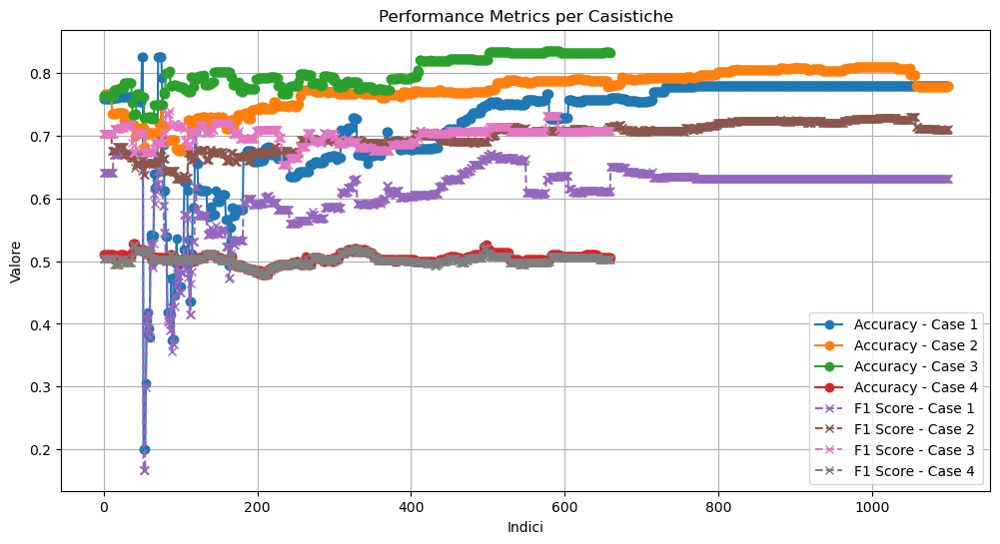

In [ ]:
import matplotlib.pyplot as plt
x_case_1 = list(range(len(case_a_acc)))
x_case_2 = list(range(len(case_b_acc)))
x_case_3 = list(range(len(case_c_acc)))
x_case_4 = list(range(len(case_d_acc)))
plt.figure(figsize=(12, 6))

# Tracciare le linee per l'accuracy
plt.plot(x_case_1, case_a_acc, label="Accuracy - Case 1", marker='o')
plt.plot(x_case_2,  case_b_acc, label="Accuracy - Case 2", marker='o')
plt.plot(x_case_3,  case_c_acc, label="Accuracy - Case 3", marker='o')
plt.plot(x_case_4,  case_d_acc, label="Accuracy - Case 4", marker='o')

# Tracciare le linee per l'F1 score
plt.plot(x_case_1,  case_a_f1, label="F1 Score - Case 1", linestyle='--', marker='x')
plt.plot(x_case_2,  case_b_f1, label="F1 Score - Case 2", linestyle='--', marker='x')
plt.plot(x_case_3, case_c_f1, label="F1 Score - Case 3", linestyle='--', marker='x')
plt.plot(x_case_4, case_d_f1, label="F1 Score - Case 4", linestyle='--', marker='x')

# Personalizzazione del grafico
plt.title("Performance Metrics per Casistiche")
plt.xlabel("Indici")
plt.ylabel("value")

plt.legend()
plt.grid(True)

In [ ]:
equality_a

[True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,

In [ ]:
df.loc[69]

age               71
workclass          2
education-num     10
marital-status     2
occupation        11
relationship       0
race               4
sex                0
capital-gain       0
capital-loss       0
hours-per-week     4
native-country    38
Probability        0
Name: 69, dtype: int64

In [ ]:

results

{(43, 2, 9, 2, 3, 0, 4, 0, 15024, 0, 50, 38): {'notes': [],
  'vs': None,
  'ideal': True,
  'times': 1,
  'dict_form': {'age': 43,
   'workclass': 2,
   'education-num': 9,
   'marital-status': 2,
   'occupation': 3,
   'relationship': 0,
   'race': 4,
   'sex': 0,
   'capital-gain': 15024,
   'capital-loss': 0,
   'hours-per-week': 50,
   'native-country': 38},
  'decision': True,
  'user': True,
  'machine': True},
 (35, 2, 14, 4, 9, 4, 4, 1, 0, 0, 32, 38): {'notes': [],
  'vs': None,
  'ideal': None,
  'times': 1,
  'dict_form': {'age': 35,
   'workclass': 2,
   'education-num': 14,
   'marital-status': 4,
   'occupation': 9,
   'relationship': 4,
   'race': 4,
   'sex': 1,
   'capital-gain': 0,
   'capital-loss': 0,
   'hours-per-week': 32,
   'native-country': 38},
  'decision': False,
  'user': False,
  'machine': False},
 (34, 2, 10, 2, 4, 0, 4, 0, 0, 0, 40, 38): {'notes': [],
  'vs': None,
  'ideal': None,
  'times': 1,
  'dict_form': {'age': 34,
   'workclass': 2,
   'educati

In [ ]:
decision_final = []
for k , result in results.items():
  decision_final.append(result['decision'])

In [ ]:
decision_final

[True,
 False,
 False,
 False,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 True,
 False,
 False,
 True,
 True,
 True,
 False,
 False,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 True,
 False,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 True,
 True,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 True,
 False,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 False,
 False,
 True,
 False,
 True,
 True,
 True,
 True,
 False,
 False,
 True,
 False,
 True,
 False,
 False,
 False,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 True,
 Fa

In [ ]:
i_true = 0
i_false = 0
for i in decision_final :
    if i == False:
        i_false+=1
    else:
        i_true+=1    

print('False:',i_false)
print('True:',i_true)       

NameError: name 'decision_final' is not defined

In [ ]:
eva

[[0,
  1.0,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [1.0,
  1.0,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  0],
 [0.5,
  0.6666666666666666,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  2,
  0],
 [0.3333333333333333,
  0.75,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  0],
 [0.5,
  0.8,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  3,
  0],
 [0.4,
  0.8333333333333334,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  4,
  0],
 [0.5,
  0.8571428571428571,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  4,
  0],
 [0.5,
  0.875,
  0,
  0.2063729370034884,
  0.5103626943005182,
  0,
  0,
  1,
  0,
  0,
  0,
  1,
  5,
  0],
 [0.5714285714285714,
  0.7777777777777778,
  0,
  0.20637293700348

Normal Frank

In [8]:
import itertools
import numpy as np
from itertools import permutations 
import json

from classes import *
from IDA_frank_main import *
EVA = True

import itertools
import numpy as np
from itertools import permutations 
import json

from classes import *
from IDA_frank_main import *
from IDA_frank_main_1 import *

#EVA = False
from river import ensemble
from river import preprocessing
from river import linear_model
from sklearn.preprocessing import LabelEncoder


In [9]:
dataset = 'adult'
target = ''
encoder = LabelEncoder()


In [10]:
KNN = False

if dataset == 'adult':
 
    target = 'Probability'
    protected = ['sex']
    rule_att = 'capital-gain'
    if KNN:
        rule_value = 9000
    else:
        rule_value = 0.086141
    cats = ['workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex',
       'native-country']
elif dataset == 'HR':
    target = 'is_promoted'
    protected = ['gender']
    rule_att = 'awards_won?'
    if KNN:
        rule_value = 0
    else:
        rule_value = 0
    cats = ['awards_won?', 'gender', 'department', 'recruitment_channel']
elif dataset == 'compas':
    target = 'two_year_recid'
    protected = ['sex']
    rule_att = 'priors_count'
    if KNN:
        rule_value = 0
    else:
        rule_value = 0
    cats = ['sex', 'race', 'c_charge_degree']
    

df = pd.read_json("Datasets/bot_"+dataset+"_stream.json")
user_train = pd.read_json("Datasets/bot_"+dataset+"_user_train.json")
frank_train = pd.read_json("Datasets/bot_"+dataset+"_frank_train.json")
test = pd.read_json("Datasets/bot_"+dataset+"_test.json")

# for i in cats:
#     df[i] = encoder.fit_transform(df[i])
#     user_train[i] = encoder.fit_transform(user_train[i])
#     frank_train[i] = encoder.fit_transform(frank_train[i])
#     test[i] = encoder.fit_transform(test[i])
    

model = GaussianNB()

#training the user
Y_user_train = list(user_train[target])
Y_user_train = [bool(y) for y in Y_user_train]
X_user_train = user_train.loc[:, user_train.columns!=target]
X_user_train = X_user_train.values.tolist()

model.fit(X_user_train, Y_user_train) 

#training Frank
Y_frank_train = list(frank_train[target])
Y_frank_train = [bool(y) for y in Y_frank_train]
X_frank_train = frank_train.loc[:, frank_train.columns!=target]
X_frank_train = list(X_frank_train.to_dict(orient='index').values())
    # 
#test set (for Frank)
Y_test = list(test[target])
Y_test = [bool(y) for y in Y_test]
X_test = test.loc[:, test.columns!=target]
X_test = list(X_test.to_dict(orient='index').values())
# 



In [11]:
target

'Probability'

In [12]:
RULE = True
PAST = True
SKEPT = True
GROUP = True

N_BINS = 10
N_VAR = 3
MAX = 5

#predict_mode = 100
#believe_mode = 0




believe_value = 0.8 #For Frank Suggestions
rethink_value = 0.8 #Individual Fairness
fairness_value = 0.25 #top records to re-label (Group Fairness)

expertise_value = 0.5
#user_model = GroundTruther(believe_value, rethink_value, fairness_value, expertise_value)
user_model = ModelBased(believe_value, rethink_value, fairness_value, GaussianNB(), X_user_train, Y_user_train)

In [13]:
efdt  =tree.ExtremelyFastDecisionTreeClassifier (nominal_attributes=cats,grace_period = 5, min_samples_reevaluate= 20)


In [5]:
for i in cats:
    print(df[i].unique())
    print()
    print(i)

[2 4 1 5 3 0]

workclass
[4 2 0 6 3 5 1]

marital-status
[ 6  2  7 10  5  3 13  8  0 11  4  9 12]

occupation
[3 0 1 4 2 5]

relationship
[2 4 1 0 3]

race
[1 0]

sex
[38 18 25 24 12 31  4 13 29 15 28  1  3 10  2  5  7 11 32 39 30 19 23 27
  0 21 17 35 22  6  9 40  8 34 26 37]

native-country


In [6]:
for i in df.columns.tolist():
    print(i,':',df[i].unique())

age : [23 40 35 22 71 31 18 37 64 56 50 19 28 55 54 41 20 29 58 48 43 52 68 21
 30 47 46 17 90 39 45 42 49 33 67 34 25 32 38 27 62 63 24 51 36 44 77 66
 53 57 81 79 73 69 61 26 59 70 82 75 60 65 72 80 76 74]
workclass : [2 4 1 5 3 0]
education-num : [ 9 10  2 13  6 12 14  7 11 15  8  5  3  4 16]
marital-status : [4 2 0 6 3 5 1]
occupation : [ 6  2  7 10  5  3 13  8  0 11  4  9 12]
relationship : [3 0 1 4 2 5]
race : [2 4 1 0 3]
sex : [1 0]
capital-gain : [    0  3137 15024  4064  2354  7688  7298  2407  3818  8614  4386  4416
  5178 25236 27828  2105 13550  9386  4865  5013  2829  2202  3103  4787
   594  2597  3411  3908  4508 99999 10566  2977  2414  7896  3464  4650
  2885  3942  1848 14344  2174  2050  2176  1151 20051  2580 14084  6849
 10520  2463  7430  1506   991  6418  3781  3674 25124  2538]
capital-loss : [   0 1887 1902 2206 2339 1977 2205 1721 1848 1258 1485 2179 4356 1668
 1762 1740 1669 1980 1617 1844 1602 1741 1974 2377 2415 1590 1594 1672
 2246 2002 1876 1579 2001 1628

In [14]:
#df_1 = create_balanced_batches(df, target, batch_size=10)
f = Frank(user_model, df, target, protected, cats, rule_att, rule_value, RULE, PAST, SKEPT, GROUP, X_test, Y_test, EVA, N_BINS, N_VAR, MAX,X_frank_train,Y_frank_train)
f.train(X_frank_train, Y_frank_train)
results, eva,accuracy_score,f1_score,equality,models_stat,models = f.start()

Model trained
Train


  0%|          | 0/2000 [00:00<?, ?it/s]

age                  36
workclass             4
education-num         9
marital-status        2
occupation            4
relationship          0
race                  4
sex                   0
capital-gain          0
capital-loss          0
hours-per-week       70
native-country       38
Probability       False
Name: 249, dtype: object
{'age': 23, 'workclass': 2, 'education-num': 9, 'marital-status': 4, 'occupation': 6, 'relationship': 3, 'race': 2, 'sex': 1, 'capital-gain': 0, 'capital-loss': 0, 'hours-per-week': 40, 'native-country': 38}
Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.8784 - output_1_loss: 1.0119 - output_2_loss: 1.7791 - output_3_loss: 1.8195 - output_4_loss: 2.5698 - output_5_loss: 1.7728 - output_6_loss: 1.5884 - output_7_loss: 0.7096 - output_8_loss: 2.8262 - output_2_sparse_categorical_accuracy: 0.1560 - output_3_sparse_categorical_accuracy: 0.0200 - output_4_sparse_categorical_accuracy: 0.0280 - output_5_sparse_categorical_accuracy: 0.208

100%|██████████| 100/100 [00:05<00:00, 17.87it/s]


{'age': 23, 'workclass': 2, 'education-num': 9, 'marital-status': 4, 'occupation': 6, 'relationship': 3, 'race': 2, 'sex': 1, 'capital-gain': 0, 'capital-loss': 0, 'hours-per-week': 40, 'native-country': 38}
Predizione originale: [1]


  0%|          | 0/2000 [00:10<?, ?it/s]


ValueError: y contains previously unseen labels: [-7.578977670164022e-05 8.293534080100786 26.27835096066101
 28.585018016314734 31.867008318310766]

In [17]:
for i ,z in enumerate(models_stat):
    print('index:',i)
    print('DF : ',z)

index: 0
DF :       parent  is_leaf  depth                       stats     feature  \
node                                                                  
0      <NA>    False      0  {False: 184.0, True: 67.0}  occupation   
1         0     True      1    {True: 3.0, False: 22.0}         NaN   
2         0     True      1    {False: 20.0, True: 4.0}         NaN   
3         0     True      1   {True: 14.0, False: 20.0}         NaN   
4         0     True      1    {False: 11.0, True: 2.0}         NaN   
5         0     True      1    {False: 13.0, True: 1.0}         NaN   
6         0     True      1    {False: 23.0, True: 1.0}         NaN   
7         0     True      1   {False: 15.0, True: 20.0}         NaN   
8         0     True      1     {True: 4.0, False: 5.0}         NaN   
9         0     True      1    {False: 24.0, True: 8.0}         NaN   
10        0     True      1    {False: 10.0, True: 3.0}         NaN   
11        0     True      1     {False: 7.0, True: 4.0}       

In [ ]:
rule  = "occupation == 1 AND captal-gain > 1"
def swap (rule):
    counter_rule = ""
    conditions = rule.split(" AND ")
    flipped_conditions = []
    flipped_conditions1 = []
   
    if "==" in rule and ("<=" in rule or ">" in rule or"=>" in rule or "<" in rule  ):
        if (len(counter_rule)==0):
            counter_rule+= "("
        else:
            counter_rule = " OR "+ "("
        
             
        for cond in conditions:
            if "==" in cond :
                feature, value = cond.split(" == ")
                counter_rule+= f"{feature} == {value}"      
            if "<=" in cond:  # Condizione numerica
                feature, threshold = cond.split(" <= ")
                flipped_cond = f"{feature} > {threshold}"
            elif ">" in cond:
                feature, threshold = cond.split(" > ")
                flipped_cond = f"{feature} <= {threshold}"
            elif "=>" in cond :
                feature, threshold = cond.split(" => ")
                flipped_cond = f"{feature} < {threshold}" 
            elif cond == "True" or cond == "False":
                flipped_cond = "True" if cond == "False" else "False"
            counter_rule += " AND ".join(flipped_conditions1)+" )"    
        flipped_conditions1.append(flipped_cond)
        counter_rule += " AND ".join(flipped_conditions1)+" )"    
        print(counter_rule)

In [ ]:
swap(rule)

(occupation == 1 ) )captal-gain <= 1 )


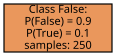

In [ ]:

df_1 = create_balanced_batches(df, target, batch_size=10)
model = tree.ExtremelyFastDecisionTreeClassifier(nominal_attributes=cats,min_samples_reevaluate=20,grace_period=20)
for x, y in zip(X_frank_train, Y_frank_train):
    model.learn_one(x, y)
Y = list(df[target])
Y = [bool(y) for y in Y]
X = df_1.loc[:, df.columns != target]
X = list(X.to_dict(orient='index').values())
copied_model = pickle.loads(pickle.dumps(model))
copied_model.draw()







In [ ]:
node = model._root
feature = node.feature
x[feature] = 9
print(node.prediction(x))
#print(node.children)

{False: 0.7330677290836654, True: 0.26693227091633465}


In [ ]:
for i in cats:
    print(i)
    print(df[i].unique())

workclass
[2 4 1 5 3 0]
marital-status
[4 2 0 6 3 5 1]
occupation
[ 6  2  7 10  5  3 13  8  0 11  4  9 12]
relationship
[3 0 1 4 2 5]
race
[2 4 1 0 3]
sex
[1 0]
native-country
[38 18 25 24 12 31  4 13 29 15 28  1  3 10  2  5  7 11 32 39 30 19 23 27
  0 21 17 35 22  6  9 40  8 34 26 37]


In [ ]:
model = tree.ExtremelyFastDecisionTreeClassifier(nominal_attributes=cats,min_samples_reevaluate=20,grace_period=20)
for x, y in zip(X_frank_train, Y_frank_train):
    model.learn_one(x, y)
node = model._root
# print(node)
# feature = node.feature
# print(feature)
# print(node.n_nodes)
# type(node.children[6])
feature = node.feature
y = X[0].copy()
print(y)
y[feature] = 9
z = y.copy()
print(y)
print(build_rule(node, z, path=""))




        
    
    



NameError: name 'X' is not defined

In [ ]:
X[0]

{'age': 23,
 'workclass': 2,
 'education-num': 9,
 'marital-status': 4,
 'occupation': 6,
 'relationship': 3,
 'race': 2,
 'sex': 1,
 'capital-gain': 0,
 'capital-loss': 0,
 'hours-per-week': 40,
 'native-country': 38}

In [ ]:
models_stat

[array([[<NA>, False, 0, {False: 183.0, True: 68.0}, 'occupation',
         {0: 0, 2: 1, 3: 2, 4: 3, 5: 4, 7: 5, 9: 6, 10: 7, 11: 8, 12: 9, 13: 10, 6: 11, 8: 12},
         {0: 0, 1: 2, 2: 3, 3: 4, 4: 5, 5: 7, 6: 9, 7: 10, 8: 11, 9: 12, 10: 13, 11: 6, 12: 8},
         GaussianSplitter (
           n_splits=10
         )                 ,
         {'age': GaussianSplitter (
           n_splits=10
         ), 'workclass': NominalSplitterClassif (), 'education-num': GaussianSplitter (
           n_splits=10
         ), 'marital-status': NominalSplitterClassif (), 'occupation': NominalSplitterClassif (), 'relationship': NominalSplitterClassif (), 'race': NominalSplitterClassif (), 'sex': NominalSplitterClassif (), 'capital-gain': GaussianSplitter (
           n_splits=10
         ), 'capital-loss': GaussianSplitter (
           n_splits=10
         ), 'hours-per-week': GaussianSplitter (
           n_splits=10
         ), 'native-country': NominalSplitterClassif ()}                         

In [ ]:
results, eva